In [1]:
import numpy as np
import torch 
from framework.SMS import import_dataset_fromSMS
import networkx as nx

distance_mode = "dijkstra" # "linear_interpolation" or "dijkstra"

datasetName = "swiss1"
datasetSuffix = "-500"
datasetPath = "data/SMS/" + datasetName  + datasetSuffix + "/"
datasetSMS = import_dataset_fromSMS(datasetPath)

CORRUPTED_NODES = 70

sim = list(datasetSMS.keys())[0]
mat = datasetSMS[sim]['adjacency_matrix']
num_nodes = mat.shape[0]
p_vectors_array = datasetSMS[sim]['p_array']
dimP = p_vectors_array.shape[1]

torch_points_labels=torch.tensor([0]*(num_nodes-CORRUPTED_NODES) + [1]*CORRUPTED_NODES)


#plot_graph_from_adjacency_matrix(mat, node_color_scalars=np.sum(p_vectors_array, axis=1), cmap='plasma')

def read_matrix_from_csv_loadtxt(filepath, delimiter=','):
  """
  Reads a NumPy matrix from a CSV file using np.loadtxt().

  Args:
    filepath (str): The path to the CSV file.
    delimiter (str): The character separating values in the CSV file (default is comma).

  Returns:
    numpy.ndarray: The matrix read from the CSV file.
  """
  try:
    matrix = np.loadtxt(filepath, delimiter=delimiter)
    print(f"Successfully loaded matrix from {filepath} using np.loadtxt().")
    return matrix
  except FileNotFoundError:
    print(f"Error: The file '{filepath}' was not found.")
    return None
  except Exception as e:
    print(f"An error occurred while loading the file: {e}")
    return None


path = "data/SMS/" + datasetName  + datasetSuffix +"/sim_" + str(sim)+ "/" + datasetName
p_vectors_array = (read_matrix_from_csv_loadtxt(path + "_p_matrix.csv"))
true_p_vectors_array = (read_matrix_from_csv_loadtxt(path + "_true_p_matrix.csv"))
dimP = p_vectors_array.shape[1]
for x in datasetSMS.values():
    x["p_array"]=p_vectors_array


Successfully loaded matrix from data/SMS/swiss1-500/sim_4390/swiss1_p_matrix.csv using np.loadtxt().
Successfully loaded matrix from data/SMS/swiss1-500/sim_4390/swiss1_true_p_matrix.csv using np.loadtxt().


In [2]:
from framework.trainFct import *
from torch_geometric.data import Data
from framework.visuals import *
from scipy.sparse.csgraph import shortest_path


latent_dim = 2
input_dim = dimP
batch_size = 16

encoder_hidden_dims=[128, 64, 32]
adj_decoder_hidden_dims=[64, 64, 32]
node_decoder_hidden_dims=[64, 64, 32]
gcn_layers=3
fc_layers=2

dataset = []
for x in datasetSMS.values():
    # Create PyG data object
    x["distance_matrix"] = shortest_path(-np.log(np.maximum(x["adjacency_matrix"], 1e-7)), directed=False, unweighted=False, method="D")
    data = Data(x=torch.tensor(x["p_array"], dtype=torch.float), 
                edge_index=adj_matrix_to_edge_index(x["adjacency_matrix"])[0], 
                edge_labels=adj_matrix_to_edge_index(x["adjacency_matrix"])[1],
                adjacency_matrix=torch.tensor(x["adjacency_matrix"]))
    dataset.append(data)

# Select a single graph to train on
single_graph = dataset[0]

# Wrap in list for compatibility with DataLoader-like expectations
single_graph_list = [single_graph]


dist_mat = shortest_path(-np.log(np.maximum(x["adjacency_matrix"], 1e-7)), directed=False, unweighted=False, method="D")

G = nx.from_numpy_array(dist_mat)
G.remove_edges_from(nx.selfloop_edges(G)) # Remove self-loops


/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:128: UserWarning: An issue occurred while importing 'torch-scatter'. Disabling its usage. Stacktrace: dlopen(/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so, 0x0006): Symbol not found: __ZN2at4_ops16div__Tensor_mode4callERNS_6TensorERKS2_NSt3__18optionalINS6_17basic_string_viewIcNS6_11char_traitsIcEEEEEE
  Referenced from: <2BF76774-0954-3F15-B7FE-8A5E5111D7DF> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so
  Expected in:     <A51C8C05-245A-3989-8D3C-9A6704422CA5> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch/lib/libtorch_cpu.dylib
  warnings.warn(f"An issue occurred while importing 'torch-scatter'. "
/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:166: UserWarning: An issue occurred while importing 'torch-sparse'. Disabling its usage. Stacktrace: dlopen(/

In [3]:
phase1_epochs = 1500
phase2_epochs = 200
lr_phase1 = 0.005
latent_dim = 2
device = "cuda" if torch.cuda.is_available() else "cpu"

encoder = MLPEncoder(
    input_dim=input_dim,
    hidden_dims=[16, 16],
    latent_dim=latent_dim,
    mlp_layers=2,
    dropout=0.2,
    activation=nn.ELU()
)


node_decoder = NodeAttributeVariationalDecoder(
    latent_dim=latent_dim,
    output_dim=input_dim,
    #hidden_dims=[5000, 128],
    #hidden_dims=[2000, 128],
    hidden_dims=[16],
    dropout=0,
    activation=nn.ELU(),
)

# Create KL annealing scheduler
kl_scheduler = KLAnnealingScheduler(
    anneal_start=0.0,
    #anneal_end=0.001,
    #anneal_end=0.8,
    anneal_end=2,
    anneal_steps=phase1_epochs * len(single_graph_list),
    anneal_type='sigmoid',
)

# Create initial model with only node decoder
model_phase1 = GraphVAE(
    encoder=encoder,
    decoders=[node_decoder],
    kl_scheduler=kl_scheduler,
    compute_latent_manifold=False,
)


In [4]:
import os

if os.path.exists("model_phase1_swissSMS.pth"):
    print("Loading pretrained model")
    model_phase1.load_state_dict(torch.load('model_phase1_swissSMS.pth'))
else:
    print("=== Starting Phase 1: Training encoder with node feature reconstruction ===")

    # Phase 1 training
    history_phase1 = train_phase1(
        model=model_phase1,
        data_loader=single_graph_list,
        num_epochs=phase1_epochs,
        lr=lr_phase1,
        weight_decay=1e-5,
        verbose=True,
        device=device,
        loss_coefficient=1
    )

    print("\n=== Phase 1 Complete ===")

    torch.save(model_phase1.state_dict(), 'model_phase1_swissSMS.pth')
    print("\n=== Phase 1 Saved ===")

    visualize_training(history_phase1)
    visualize_node_features_reconstruction(model_phase1, single_graph, sample_features=dimP)
    visualize_latent_space(model_phase1, [single_graph])


Loading pretrained model


/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_68928/449094116.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_phase1.load_state_dict(torch.load('model

Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6942.41it/s]


Completed. Cached 10201 / 10201 points.


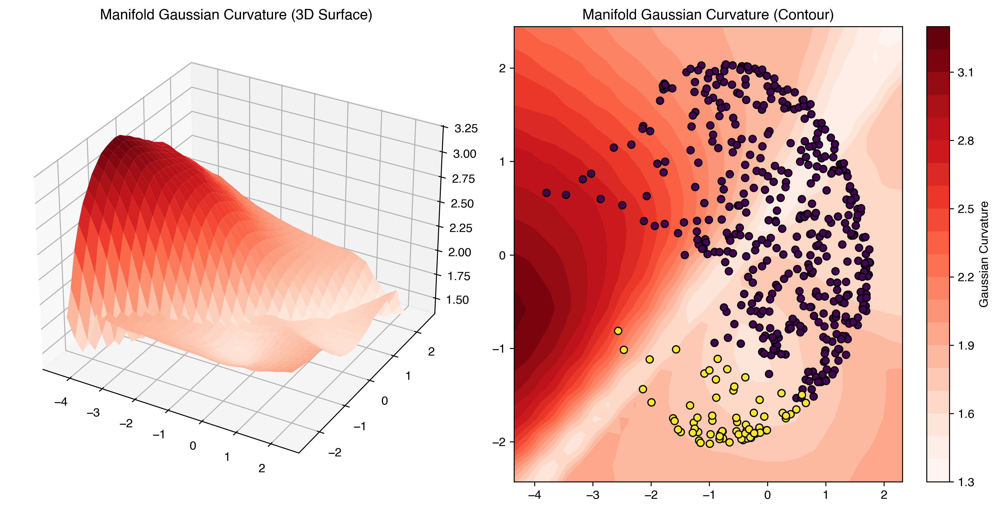

Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

In [5]:
import copy
from framework.torchVersions.distanceApproximations import DistanceApproximations
from framework.boundedManifold import BoundedManifold

model_phase1 = model_phase1.to('cpu')
model_phase1.encoder.eval()
model_phase2 = copy.deepcopy(model_phase1)

model_phase1.eval()

with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu = model_phase1.encode(x, edge_index=edge_index)

latent_points = latent_mu[0]

model_phase1.set_compute_latent_manifold(True)
model_phase1.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase1.get_latent_manifold().compute_full_grid_metric_tensor()
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points, labels=torch.tensor([0]*(num_nodes-CORRUPTED_NODES) + [1]*CORRUPTED_NODES))

with torch.no_grad():
    if distance_mode == "linear_interpolation":
        dists_phase1 = model_phase1.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                            DistanceApproximations.linear_interpolation_distance, num_points=20)
    elif distance_mode == "dijkstra":
        dists_phase1 = model_phase1.get_latent_manifold().get_grid_as_graph().compute_shortest_paths(
                            latent_points,
                            weight_type="geodesic",  # Uses your metric tensors
                            max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
                            num_threads=6
                        )


In [7]:
from framework.KLAnnealingScheduler import NoKLScheduler

#lr_phase2 = 0.0005
lr_phase2 = 0.008
phase2_epochs = 100

print("=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===")

model_phase2.set_compute_latent_manifold(True)
model_phase2.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase2.set_encoder_freeze(True)


distance_decoder = ManifoldHeatKernelDecoder(
    distance_mode=distance_mode,
    latent_dim=latent_dim,
    num_eigenvalues=500,
    num_integration_points=20,
    name="adj_decoder",
    ema_lag_factor=0.005,
    num_heat_time=15,
    retain_high_freq_threshold=0.7,
    suppress_low_freq_threshold= 5e-1,
)

# Add to your GraphVAE model
model_phase2.add_decoder(distance_decoder)

# Set reference decoder (the node attribute decoder)
#model_phase2.get_decoder("adj_decoder").giveManifoldInstance(model_phase2.get_latent_manifold())
model_phase2.get_decoder("adj_decoder").giveVAEInstance(model_phase2)

# Reset KL scheduler for phase 2
model_phase2.kl_scheduler = NoKLScheduler()

# Phase 2 training
history_phase2 = train_phase2(
    model=model_phase2,
    data_loader=single_graph_list,
    latent_points=latent_points,
    num_epochs=phase2_epochs,
    lr=lr_phase2,
    weight_decay=1e-5,
#    decoder_weights={"adj_decoder": -1, "node_attr_decoder":-1 },
    decoder_weights={"adj_decoder": 1, "node_attr_decoder":0 },
    verbose=True,
    device=device
)

print("\n=== Phase 2 Complete ===")



=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===

Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7422.32it/s]


Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Selected heat times: tensor([1.0000, 1.1041, 1.2190, 1.3459, 1.4860, 1.6407, 1.8114, 2.0000, 2.2082,
        2.4380, 2.6918, 2.9720, 3.2813, 3.6229, 4.0000])
Current HK loss: 18600.626953
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7181.63it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 16518.263672
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7617.62it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 14718.233398
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6874.53it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 13184.482422
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7583.02it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 11867.250000
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7433.58it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 10771.861328
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7502.72it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 9852.619141
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6869.01it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 9088.207031
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7561.72it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 8455.167969
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7571.00it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 7929.245605
Phase 2 - Epoch 10/100 - Loss: 7929.2456, KL: 0.0000 (weight: 0.0000), Adj: 7929.2456, Node: 0.0000
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6679.23it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 7495.042480
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7448.26it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 7134.812500
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7409.28it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 6834.823242
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7471.04it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 6585.663574
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6883.08it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 6380.284180
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7561.76it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 6214.280273
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6884.15it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 6075.057617
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7428.23it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5960.187012
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6774.34it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5867.542480
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7615.68it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5792.815918
Phase 2 - Epoch 20/100 - Loss: 5792.8159, KL: 0.0000 (weight: 0.0000), Adj: 5792.8159, Node: 0.0000
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6466.24it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5730.853027
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6866.17it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5679.809570
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7571.23it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5640.928711
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7328.84it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5609.687012
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7032.74it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5583.608398
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7362.98it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5563.990723
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7511.02it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5547.691895
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6867.46it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5534.962891
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7342.85it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5524.587891
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6873.93it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5517.878418
Phase 2 - Epoch 30/100 - Loss: 5517.8784, KL: 0.0000 (weight: 0.0000), Adj: 5517.8784, Node: 0.0000
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7361.25it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5512.046875
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7536.64it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5508.515137
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6758.91it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5506.606934
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6634.31it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5504.293457
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7540.91it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5502.821289
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7526.90it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5501.533203
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6999.04it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5500.333008
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7522.11it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5499.831543
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7682.43it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5499.370117
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6629.00it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5498.784668
Phase 2 - Epoch 40/100 - Loss: 5498.7847, KL: 0.0000 (weight: 0.0000), Adj: 5498.7847, Node: 0.0000
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6698.61it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5498.331543
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7549.90it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5497.908203
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7487.86it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5497.282715
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7518.07it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5496.688965
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6496.28it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5495.882812
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6609.98it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5494.665039
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7805.55it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5493.633789
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7667.52it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5492.404785
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7419.00it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5490.712402
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6870.72it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5488.760742
Phase 2 - Epoch 50/100 - Loss: 5488.7607, KL: 0.0000 (weight: 0.0000), Adj: 5488.7607, Node: 0.0000
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7602.75it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5487.086914
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7638.51it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5486.047363
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7003.57it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5484.364746
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7640.79it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5482.484375
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7578.88it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5480.422363
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6997.82it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5478.708008
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7143.57it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5476.563477
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7643.87it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5474.474609
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7758.62it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5472.249023
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7668.71it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5470.010742
Phase 2 - Epoch 60/100 - Loss: 5470.0107, KL: 0.0000 (weight: 0.0000), Adj: 5470.0107, Node: 0.0000
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7091.30it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5467.815430
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6910.48it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5465.712402
Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7620.06it/s]

Completed. Cached 10201 / 10201 points.


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:01<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

Current HK loss: 5463.454102


KeyboardInterrupt: 

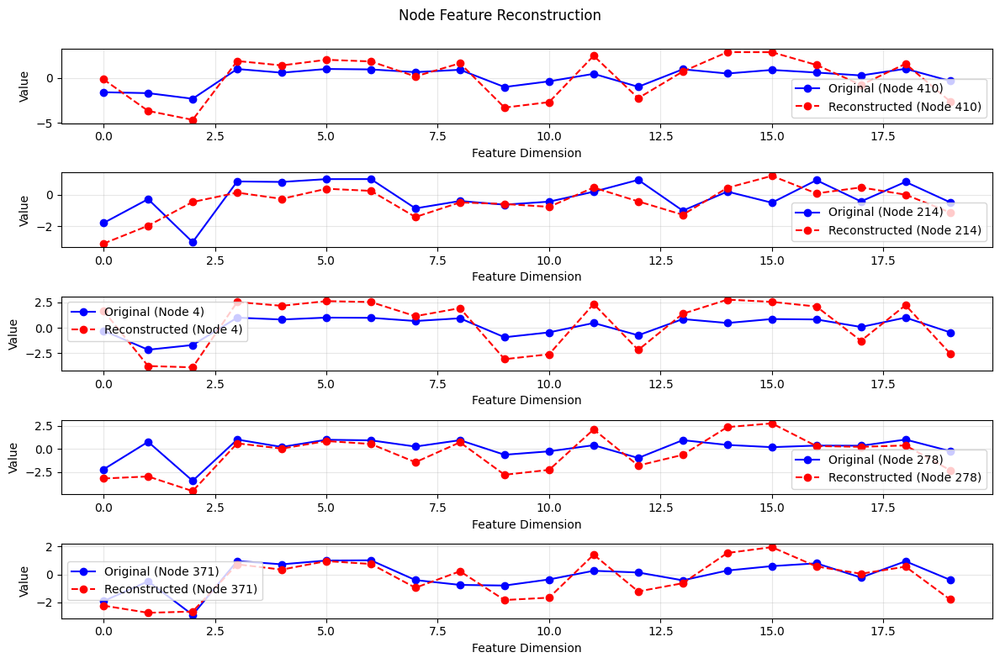

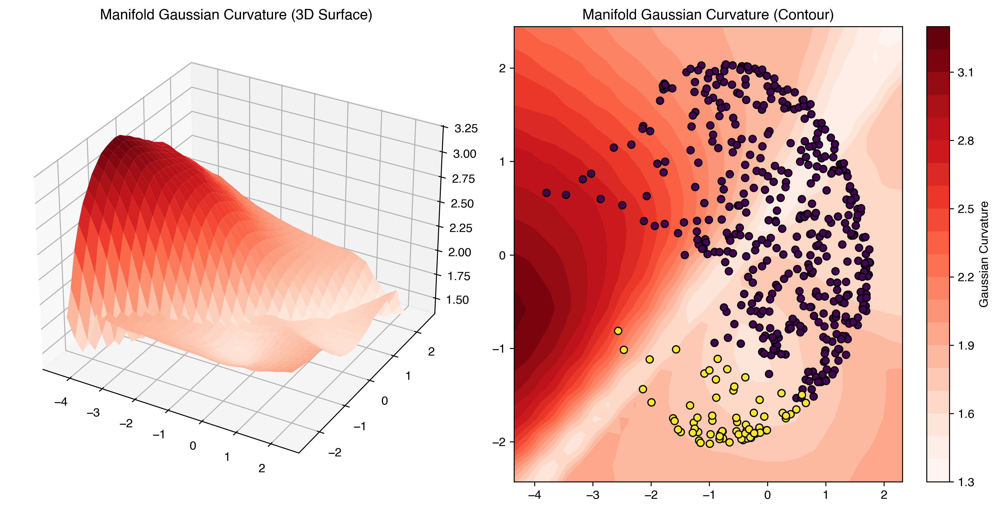

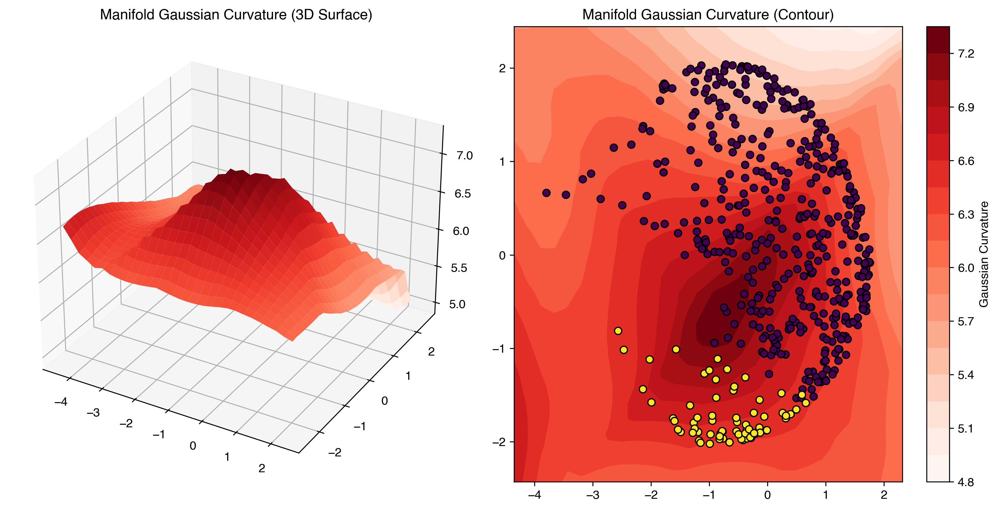

In [8]:
visualize_node_features_reconstruction(model_phase2, single_graph, sample_features=dimP)
with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu2 = model_phase2.encode(x, edge_index=edge_index)

model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0], labels=torch_points_labels)
model_phase2.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0], labels=torch_points_labels)

Full grid already computed for current epoch.
Full grid already computed for current epoch.


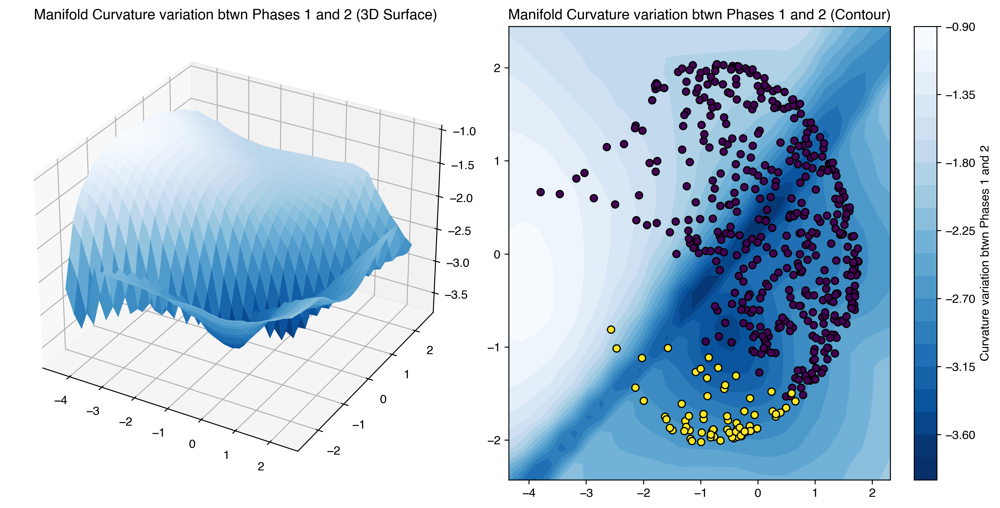

In [9]:
def compute_curvature_change(model1: GraphVAE, model2: GraphVAE):
    model1.get_latent_manifold().compute_full_grid_metric_tensor()
    model2.get_latent_manifold().compute_full_grid_metric_tensor()
    resolution = 30
    bounds_np = model1.get_latent_manifold().get_bounds().cpu().numpy()
    plot_z1 = np.linspace(bounds_np[0, 0], bounds_np[0, 1], resolution)
    plot_z2 = np.linspace(bounds_np[1, 0], bounds_np[1, 1], resolution)

    Z1_np, Z2_np = np.meshgrid(plot_z1, plot_z2)
    Z1, Z2 = torch.from_numpy(Z1_np), torch.from_numpy(Z2_np)
                
    curvature_phase1 = torch.zeros((resolution, resolution))
    curvature_phase2 = torch.zeros((resolution, resolution))

    for i in range(resolution):
        for j in range(resolution):
            z = torch.stack([Z1[i, j], Z2[i, j]])
            clamped_z = model1.get_latent_manifold()._clamp_point_to_bounds(z)
            try:
                curv_val_1 = model1.get_latent_manifold().compute_gaussian_curvature(model1.get_latent_manifold().metric_tensor(clamped_z))
                curvature_phase1[i, j] = curv_val_1
            except (ValueError, RuntimeError) as e:
                print(f"Error computing curvature at point {z}: {e}. Setting to NaN.")
                curvature_phase1[i, j] = torch.nan

            try:
                curv_val_2 = model2.get_latent_manifold().compute_gaussian_curvature(model2.get_latent_manifold().metric_tensor(clamped_z))
                curvature_phase2[i, j] = curv_val_2
            except (ValueError, RuntimeError) as e:
                print(f"Error computing curvature at point {z}: {e}. Setting to NaN.")
                curvature_phase2[i, j] = torch.nan
            
    curvature_diff = (curvature_phase1 - curvature_phase2)/(curvature_phase1 + 1e-8)
    curvature_diff = curvature_diff.detach().numpy()

    return curvature_diff, Z1_np, Z2_np
curvature_diff, Z1_np, Z2_np = compute_curvature_change(model_phase1, model_phase2)
model_phase2.get_latent_manifold()._plot_manifold_grid(curvature_diff, Z1_np, Z2_np, latent_points=latent_points, labels=torch_points_labels, name="Curvature variation btwn Phases 1 and 2")

In [10]:
with torch.no_grad():
    if distance_mode == "linear_interpolation":
        dists_phase2 = model_phase2.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                            DistanceApproximations.linear_interpolation_distance, num_points=20)
    elif distance_mode == "dijkstra":
        dists_phase2 = model_phase2.get_latent_manifold().get_grid_as_graph().compute_shortest_paths(
                            latent_points,
                            weight_type="geodesic",  # Uses your metric tensors
                            max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
                            num_threads=6
                        )

Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances (batched):   0%|          | 0/125250 [00:00<?, ?it/s]

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_68928/2485397397.py:8: RuntimeWarning: invalid value encountered in divide
  res3 = np.abs((local_dists_phase1 - dists_phase2)/local_dists_phase1)


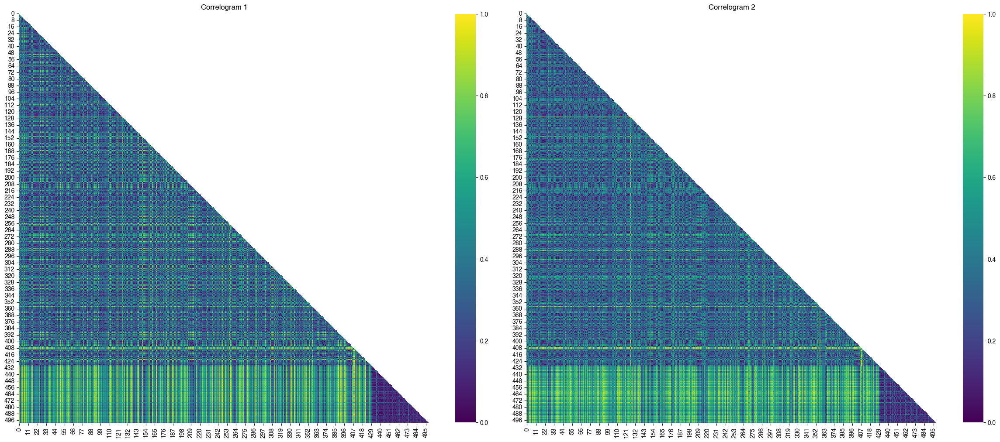

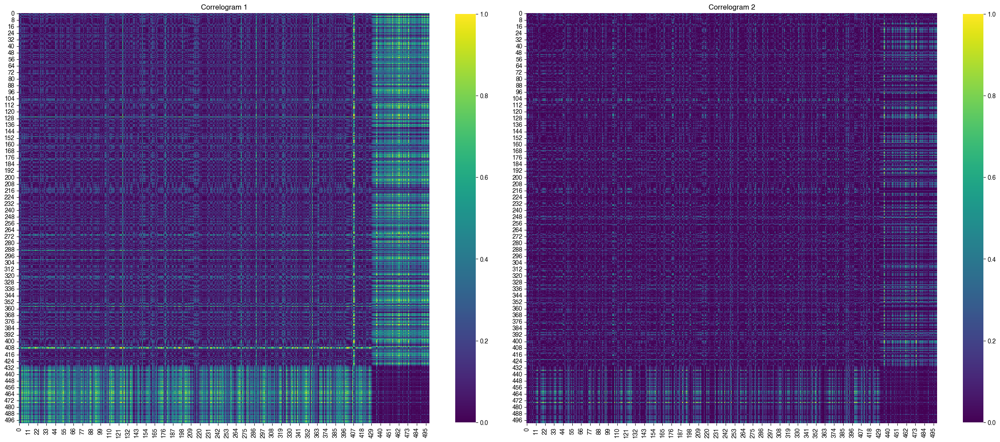

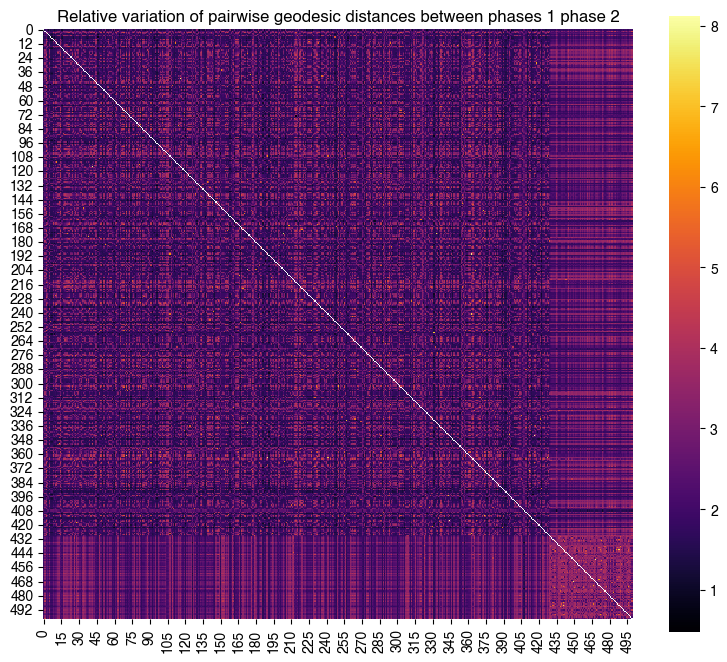

In [11]:
if isinstance(dists_phase1, torch.Tensor):
    dists_phase1 = dists_phase1.detach().numpy()
if isinstance(dists_phase2, torch.Tensor):
    dists_phase2 = dists_phase2.detach().numpy()

local_dists_phase1 = dists_phase1
res = np.abs((local_dists_phase1 - dists_phase2))
res3 = np.abs((local_dists_phase1 - dists_phase2)/local_dists_phase1)

res2 = np.abs((local_dists_phase1/np.max(np.where(local_dists_phase1 > 0, local_dists_phase1, 0)) - dists_phase2/np.max(np.where(dists_phase2 > 0, dists_phase2, 0))))

_ = plot_correlogram(local_dists_phase1/np.max(np.where(local_dists_phase1 > 0, local_dists_phase1, 0)), dists_phase2/np.max(np.where(dists_phase2 > 0, dists_phase2, 0)), remove_diagonal=True, triangular=True)

_ = plot_correlogram((res/np.max(res))**2, (res2/np.max(res2))**2)
_ = plot_correlogram(res3, cmap="inferno", titles=["Relative variation of pairwise geodesic distances between phases 1 phase 2"] )

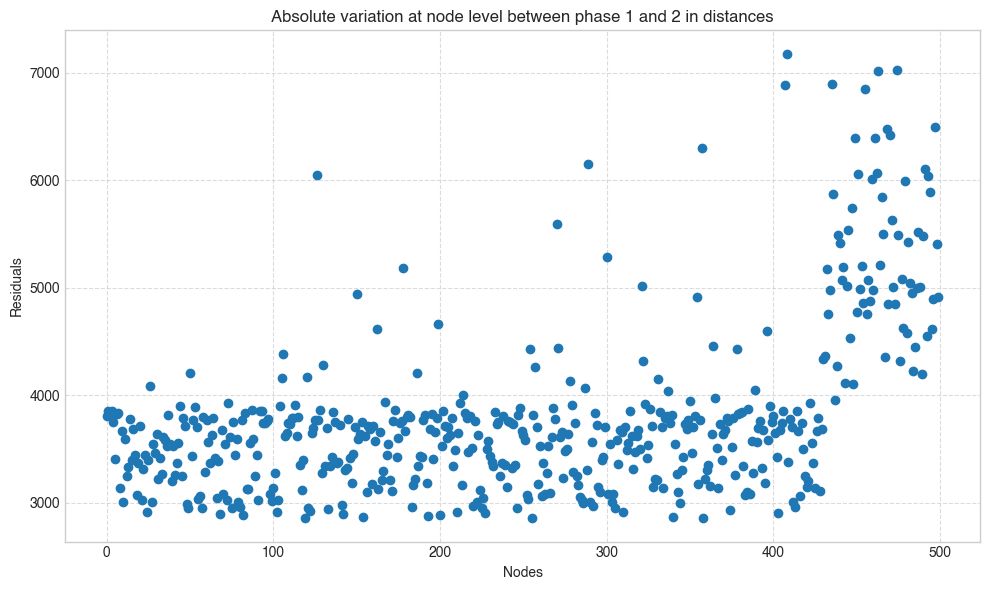

In [12]:
plt.figure(figsize=(10, 6)) # Set the size of the plot for better readability

plt.rcParams['font.family'] = 'sans-serif'
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']
#plt.plot(np.sum(res, axis=0)/np.max(np.sum(res, axis=0), axis=0), marker='o', linestyle='')
#plt.plot(np.sum(res2, axis=0)/np.max(np.sum(res2, axis=0), axis=0), marker='o', linestyle='')
plt.plot(np.sum(np.nan_to_num(res, 0.0), axis=0), marker='o', linestyle='')
# Add a horizontal line at y=0

# --- Customize the Plot ---
#plt.savefig("dists_total_var_phase1_2.png", dpi=500, bbox_inches='tight')

plt.xlabel('Nodes') # Label for the x-axis
plt.ylabel('Residuals') # Label for the y-axis, updated to reflect the ratio
plt.title('Absolute variation at node level between phase 1 and 2 in distances') # Title of the plot, updated
plt.grid(True, linestyle='--', alpha=0.7) # Add a grid for easier reading
plt.tight_layout() # Adjust plot to ensure everything fits without overlapping
plt.show()